In [2]:
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
import pickle


def crear_dataframe(dataset_dir):
    subcarpetas = ['train', 'val', 'test']
    data = {'ruta': [], 'etiqueta': [], 'tipo': []}
    
    for subcarpeta in subcarpetas:
        for categoria in ['benigno', 'maligno']:
            dir_path = os.path.join(dataset_dir, subcarpeta, categoria)
            
            for filename in os.listdir(dir_path):
                parts = filename.split('_')
                
                # Verificar si el archivo es del tipo nuevo o del antiguo
                if len(parts) > 2 and (parts[0] == 'oral'):
                    # Formato nuevo: oral_benigno_Normal_400x_112_1_13
                    tipo_cancer = parts[0]  # 'oral'
                    etiqueta = parts[1]  # 'benigno' o 'maligno'
                    # No necesitamos concatenar el resto ya que solo queremos el tipo de cáncer y la etiqueta
                elif len(parts) == 3:
                    # Formato antiguo: colon_benigno_colonn3
                    tipo_cancer, etiqueta, _ = parts
                else:
                    print(f"Archivo {filename} ignorado por tener un formato incorrecto.")
                    continue  # Si no cumple con ninguno de los formatos esperados, ignorar este archivo
                
                ruta_completa = os.path.join(dir_path, filename)
                data['ruta'].append(ruta_completa)
                data['etiqueta'].append(etiqueta) 
                data['tipo'].append(tipo_cancer)
    
    return pd.DataFrame(data)


def crear_generadores_por_tipo(df, tipo_cancer, target_size=(256, 256), batch_size=20):
    # Filtrar el DataFrame por el tipo de cáncer
    df_filtrado = df[df['tipo'] == tipo_cancer]
    
    
    datagen = ImageDataGenerator(rescale=1./255)
    
    # Filtrar adicionalmente por datos de entrenamiento y validación
    df_train = df_filtrado[df_filtrado['ruta'].str.contains('train')]
    df_val = df_filtrado[df_filtrado['ruta'].str.contains('val')]
    
    # Crear el generador de entrenamiento
    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',  
        shuffle=True  
    )
    
    # Crear el generador de validación
    validation_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',  
        shuffle=False  
    )
    
    return train_generator, validation_generator


def crear_generador_test(df, tipo_cancer, target_size=(256, 256), batch_size=20):
    # Filtrar el DataFrame por el tipo de cáncer y que la ruta contenga 'test'
    df_test = df[(df['tipo'] == tipo_cancer) & (df['ruta'].str.contains('test'))]
    
    datagen = ImageDataGenerator(rescale=1./255)  # Reescalado de las imágenes
    
    # Crear el generador de test
    test_generator = datagen.flow_from_dataframe(
        dataframe=df_test,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',  # Asumiendo clasificación binaria
        shuffle=False  # No se mezcla para asegurar la correspondencia con las etiquetas
    )
    
    return test_generator


import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img


# Función para ocultar secciones de la imagen
def ocultar_seccion(imagen, top_left, tamano, valor_ocultacion=0.5):
    imagen_modificada = np.copy(imagen)
    x, y = top_left
    ancho, alto = tamano
    imagen_modificada[y:y+alto, x:x+ancho, :] = valor_ocultacion
    return imagen_modificada

# Función para visualizar la ocultación con predicción
def visualizar_ocultacion_con_prediccion(imagen, modelo, top_left, tamano_parche):
    imagen_oculta = ocultar_seccion(imagen, top_left, tamano_parche)
    prediccion = modelo.predict(np.expand_dims(imagen_oculta, axis=0))
    
    plt.figure(figsize=(6, 6))
    plt.imshow(imagen_oculta)
    plt.title(f"Predicción: {prediccion[0]}")
    plt.show()

    return prediccion
def generar_mostrar_mapa_calor(ruta_imagen, modelo, tamano_parche=32, paso=16):
    # Extraer la clase real de la ruta de la imagen
    partes_ruta = ruta_imagen.split('/')  
    clase_real = partes_ruta[-2] 

    # Cargar y preprocesar la imagen
    imagen = load_img(ruta_imagen, target_size=(256, 256))
    imagen_array = img_to_array(imagen) / 255.0
    mapa_calor = np.zeros((imagen_array.shape[0], imagen_array.shape[1]))

    # Predicción de la imagen original para comparar
    prediccion_original = modelo.predict(np.expand_dims(imagen_array, axis=0), verbose=0)[0][0]
    clase_predicha = 'maligno' if prediccion_original > 0.5 else 'benigno'

    # Iterar sobre la imagen con un parche deslizante
    for y in range(0, imagen_array.shape[0] - tamano_parche, paso):
        for x in range(0, imagen_array.shape[1] - tamano_parche, paso):
            imagen_modificada = ocultar_seccion(imagen_array, (x, y), (tamano_parche, tamano_parche))
            prediccion_modificada = modelo.predict(np.expand_dims(imagen_modificada, axis=0), verbose=0)[0][0]
            cambio_prediccion = np.abs(prediccion_original - prediccion_modificada)
            mapa_calor[y:y+tamano_parche, x:x+tamano_parche] += cambio_prediccion

    # Normalizar el mapa de calor
    mapa_calor = mapa_calor / np.max(mapa_calor)

    # Configurar la visualización de ambas imágenes lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    
    # Mostrar la imagen original con la clase real y predicha en el título
    axs[0].imshow(imagen)
    axs[0].set_title(f'Original - Real: {clase_real}, Predicha: {clase_predicha}')
    axs[0].axis('off')
    
    # Mostrar el mapa de calor en la segunda subtrama
    axs[1].imshow(imagen)
    axs[1].imshow(mapa_calor, cmap='jet', alpha=0.5)  # superpone el mapa de calor
    axs[1].set_title(f'Mapa de Calor {modelo}')
    axs[1].axis('off')
    
    plt.show()

dataset_dir = r"C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset"
df = crear_dataframe(dataset_dir)

# lung Best Model

In [3]:
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.metrics import classification_report

# Asumiendo que crear_generador_test está definido en otro lugar y prepara correctamente los datos
test_generator = crear_generador_test(df, 'colon', target_size=(256, 256), batch_size=20)

# Carga y compila los modelos
colon_modelo1 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/colon_mejor_modelo.h5')


colon_modelo2 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/colon_mejor_modelo_2.h5')


colon_modelo_ResNet50 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/colon_modelo_ResNet50.h5')


colon_modelo_VGG16 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/colon_modelo_VGG16.h5')


resultado_test = colon_modelo1.evaluate(test_generator)
print(f'modelo 1:{resultado_test}')


resultado_test = colon_modelo2.evaluate(test_generator)
print(f'modelo 2:{resultado_test}')

resultado_test = colon_modelo_ResNet50.evaluate(test_generator)
print(f'modelo ResNet50:{resultado_test}')

resultado_test = colon_modelo_VGG16.evaluate(test_generator)
print(f'modelo VGG16:{resultado_test}')




Found 2022 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


102/102 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - accuracy: 0.9558 - loss: 0.1387
modelo 1:[0.2247454673051834, 0.8966370224952698]
102/102 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - accuracy: 0.9425 - loss: 0.2779
modelo 2:[0.29344290494918823, 0.9035608172416687]
102/102 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.8092 - false_negatives: 35.5049 - false_positives: 160.4951 - loss: 0.4168
modelo ResNet50:[0.39544594287872314, 0.8288822770118713, 130.0, 216.0]
102/102 ━━━━━━━━━━━━━━━━━━━━ 345s 3s/step - accuracy: 0.9825 - false_negatives_1: 0.0000e+00 - false_positives_1: 17.4175 - loss: 0.0388
modelo VGG16:[0.027983877807855606, 0.9881305694580078, 0.0, 24.0]


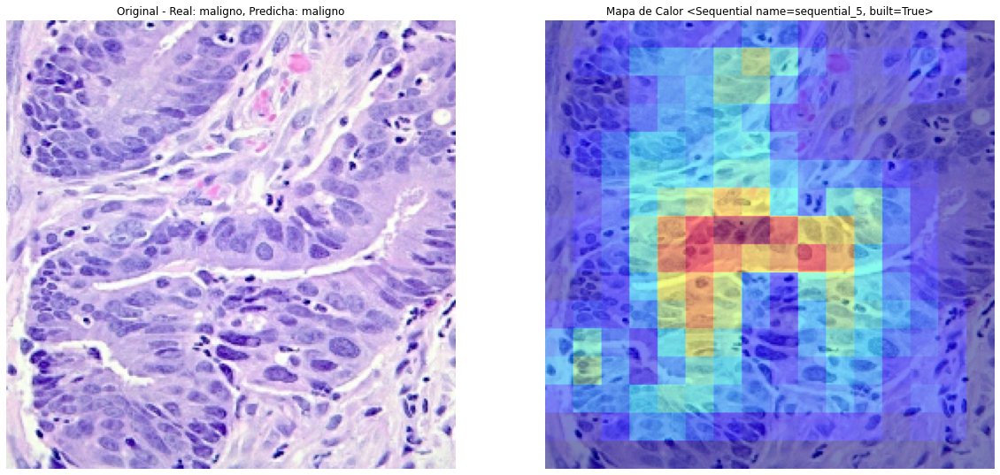

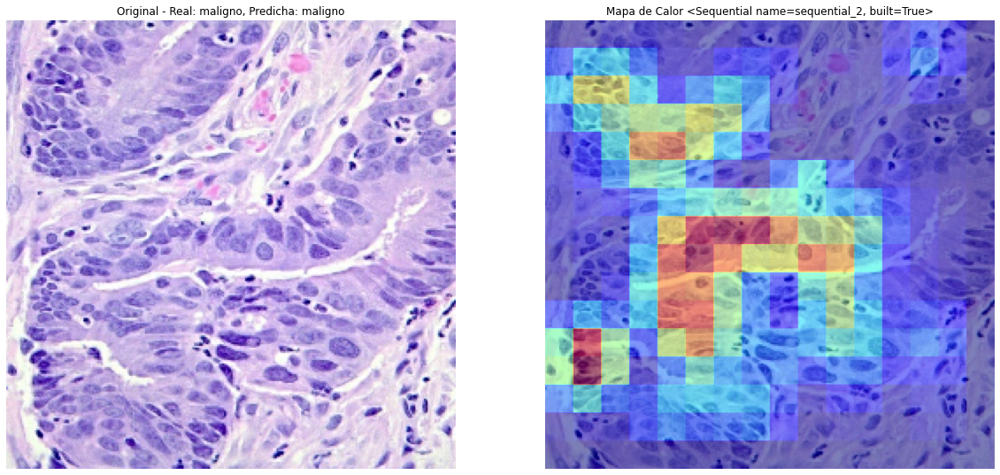

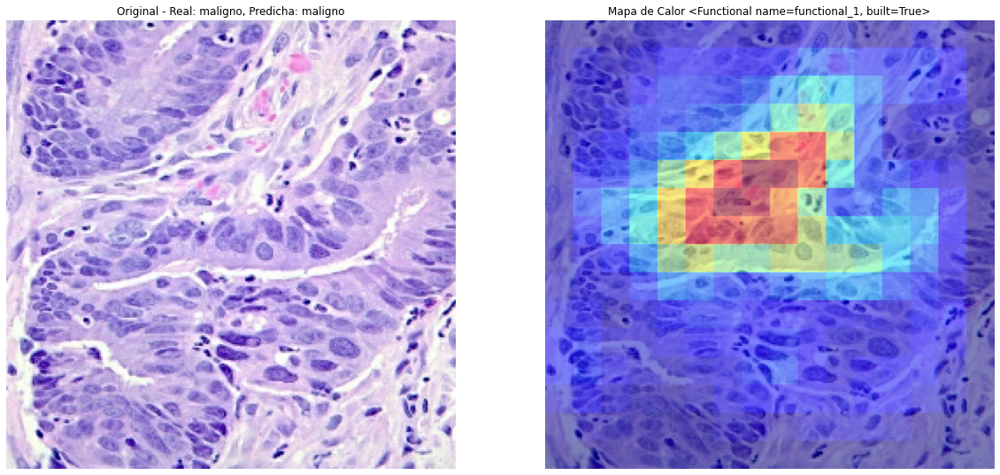

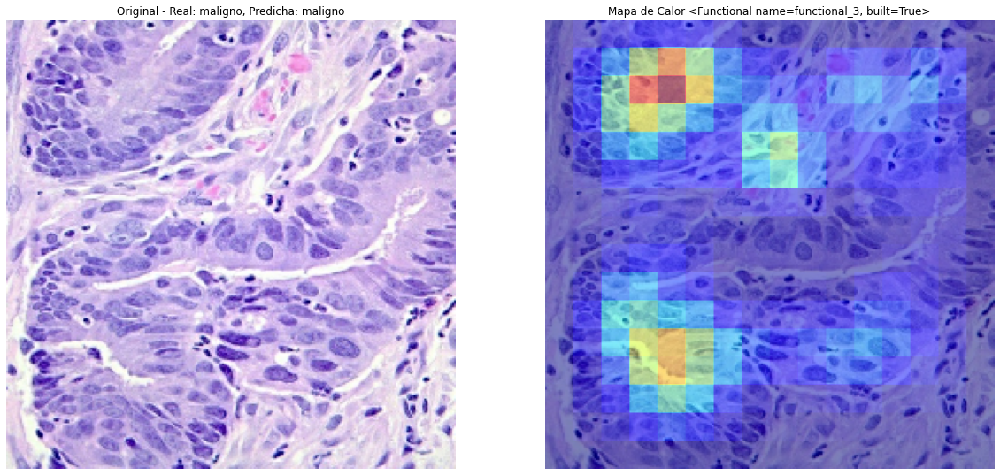

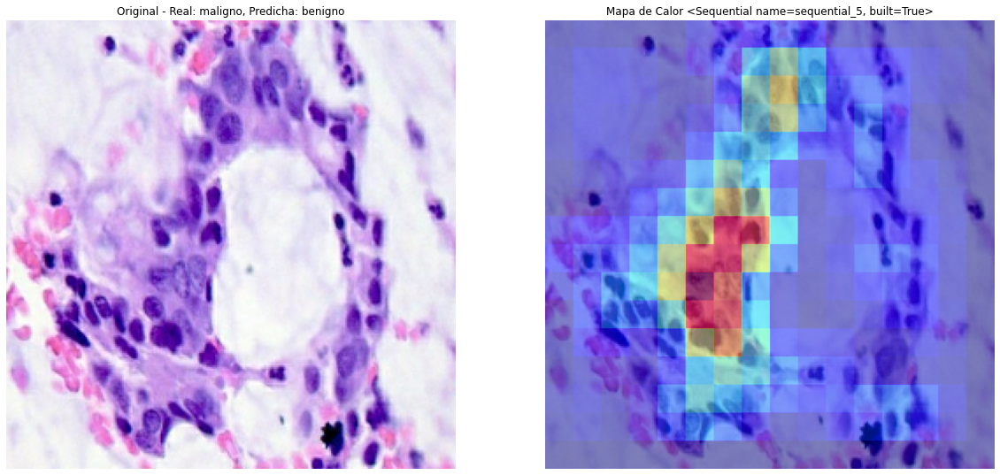

...

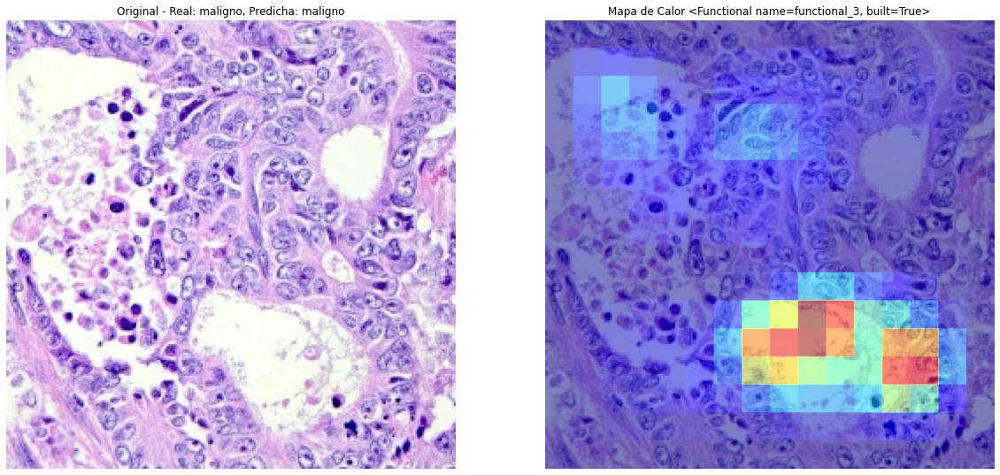

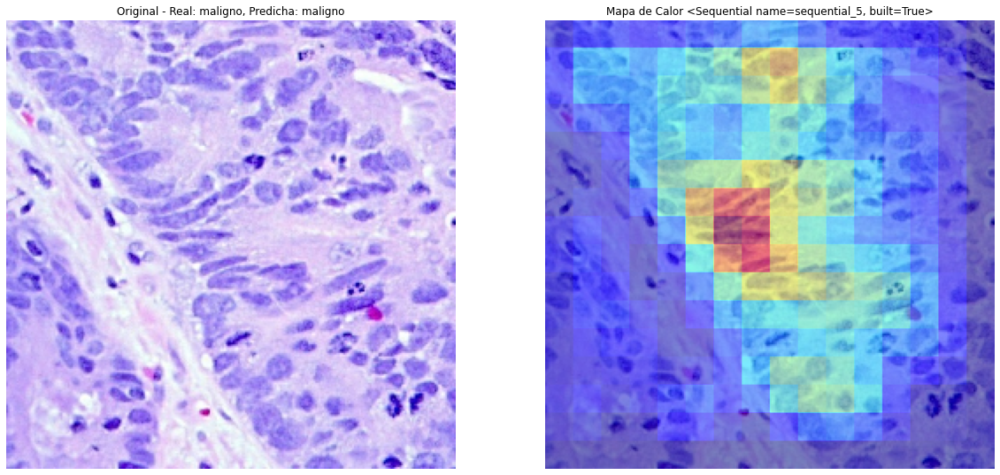

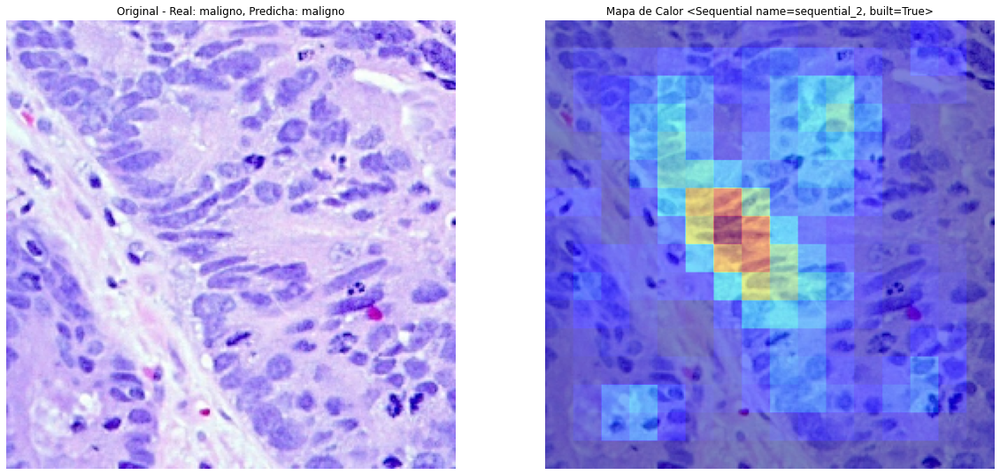

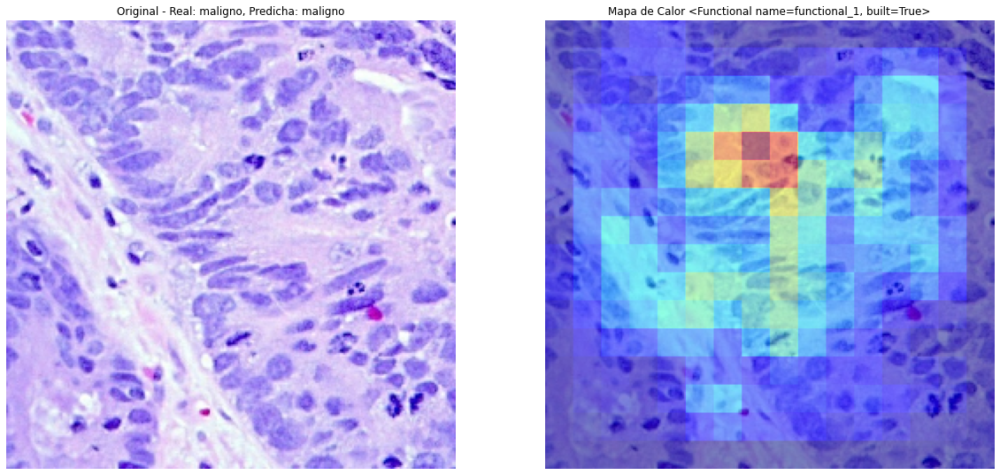

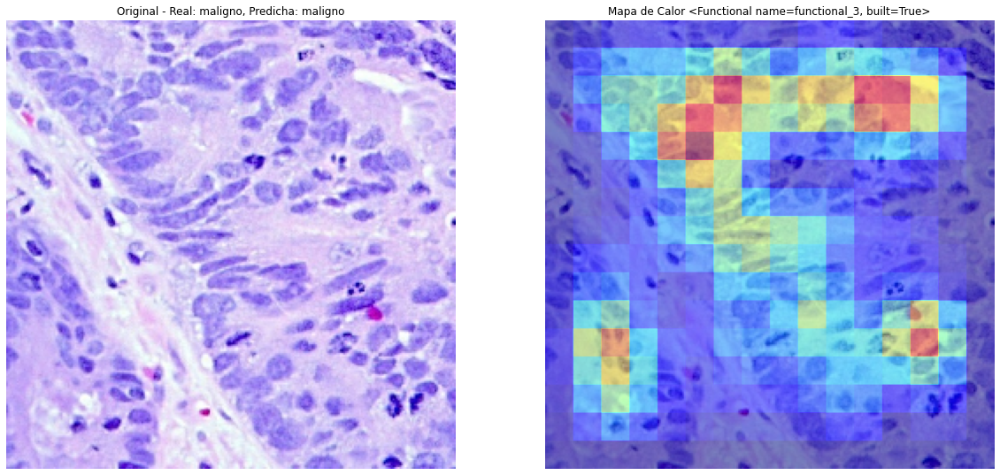

In [4]:



# Lista de imágenes para analizar
lista_rutas_imagenes = [
    r"C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/colon_maligno_colonca7.jpeg",
    r'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/colon_maligno_colonca130.jpeg',
    r'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/colon_maligno_colonca1085.jpeg',
    r'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/colon_maligno_colonca872.jpeg'
    ]


# Proceso para predecir y mostrar el mapa de calor para cada imagen
for ruta_imagen in lista_rutas_imagenes:
    imagen = load_img(ruta_imagen, target_size=(256, 256))
    imagen_array = img_to_array(imagen) / 255.0
    generar_mostrar_mapa_calor(ruta_imagen, colon_modelo1)
    generar_mostrar_mapa_calor(ruta_imagen, colon_modelo2)
    generar_mostrar_mapa_calor(ruta_imagen, colon_modelo_ResNet50)
    generar_mostrar_mapa_calor(ruta_imagen, colon_modelo_VGG16)

# Lung Best Model

In [5]:
from sklearn.metrics import classification_report
import numpy as np

test_generator = crear_generador_test(df, 'lung', target_size=(256, 256), batch_size=20)
# Genera predicciones para cada modelo
lung_modelo1 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/lung_models/lung_mejor_modelo.h5')

lung_modelo2 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/lung_models/lung_mejor_modelo_2.h5')

lung_modelo_ResNet50 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/lung_models/lung_modelo_ResNet50.h5')

lung_modelo_VGG16 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/lung_models/lung_modelo_VGG16.h5')



resultado_test = lung_modelo1.evaluate(test_generator)
print(f'modelo 1:{resultado_test}')


resultado_test = lung_modelo2.evaluate(test_generator)
print(f'modelo 2:{resultado_test}')

resultado_test = lung_modelo_ResNet50.evaluate(test_generator)
print(f'modelo ResNet50:{resultado_test}')

resultado_test = lung_modelo_VGG16.evaluate(test_generator)
print(f'modelo VGG16:{resultado_test}')



Found 3066 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


154/154 ━━━━━━━━━━━━━━━━━━━━ 48s 288ms/step - accuracy: 0.9893 - loss: 0.0406
modelo 1:[0.024171382188796997, 0.9934768676757812]
154/154 ━━━━━━━━━━━━━━━━━━━━ 35s 222ms/step - accuracy: 0.9894 - loss: 0.0318
modelo 2:[0.025665048509836197, 0.9918460249900818]
154/154 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.6545 - false_negatives_2: 6.9806 - false_positives_2: 426.2968 - loss: 0.5534
modelo ResNet50:[0.3101138770580292, 0.8284409642219543, 14.0, 512.0]
154/154 ━━━━━━━━━━━━━━━━━━━━ 462s 3s/step - accuracy: 0.9976 - false_negatives_3: 1.3935 - false_positives_3: 1.7226 - loss: 0.0085
modelo VGG16:[0.005735162179917097, 0.9983692169189453, 3.0, 2.0]


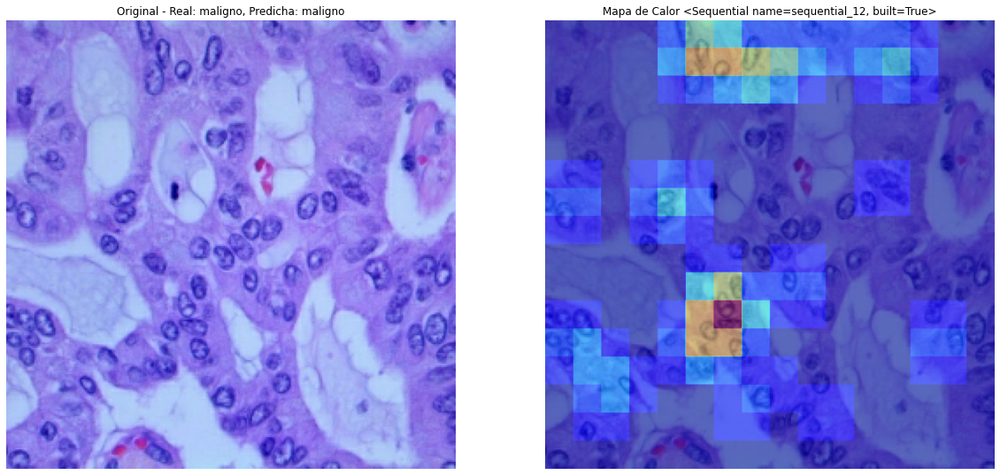

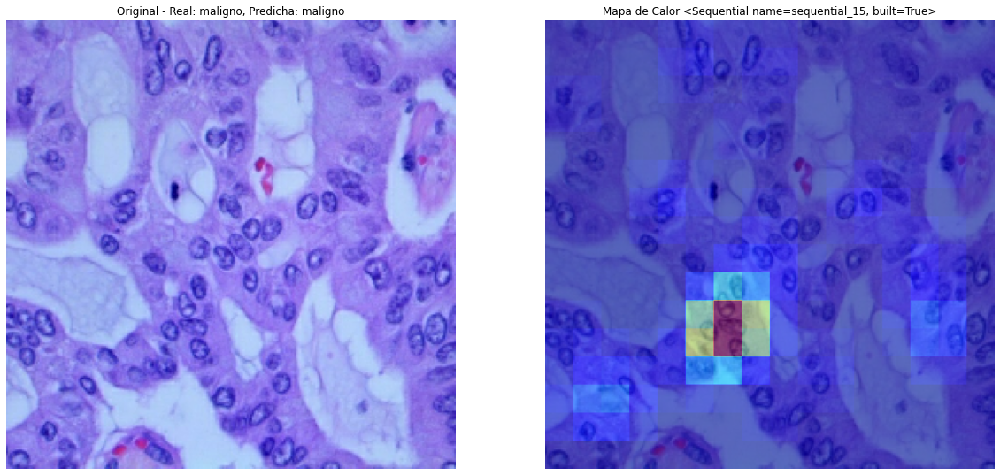

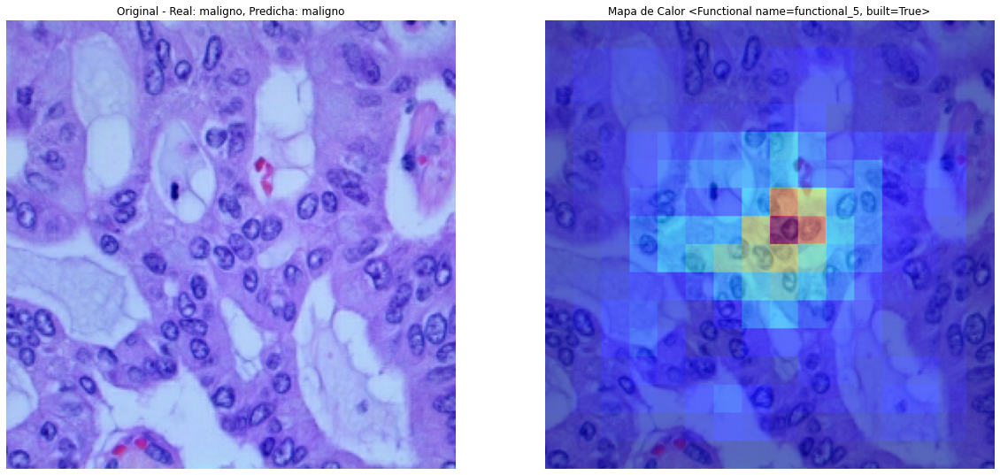

KeyboardInterrupt: 

In [6]:


# Lista de imágenes para analizar
lista_rutas_imagenes = [
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/lung_maligno_lungaca3879.jpeg',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/lung_maligno_lungaca4005.jpeg',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/lung_maligno_lungscc58.jpeg',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/lung_maligno_lungscc388.jpeg'
    ]

# Proceso para predecir y mostrar el mapa de calor para cada imagen
for ruta_imagen in lista_rutas_imagenes:
    imagen = load_img(ruta_imagen, target_size=(256, 256))
    imagen_array = img_to_array(imagen) / 255.0
    generar_mostrar_mapa_calor(ruta_imagen, lung_modelo1)
    generar_mostrar_mapa_calor(ruta_imagen, lung_modelo2)
    generar_mostrar_mapa_calor(ruta_imagen, lung_modelo_ResNet50)
    generar_mostrar_mapa_calor(ruta_imagen, lung_modelo_VGG16)

# Gastrointestinal Best Model

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

test_generator = crear_generador_test(df, 'gastrointestinal', target_size=(256, 256), batch_size=20)
# Genera predicciones para cada modelo
gastrointestinal_modelo1 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/gastrointestinal_mejor_modelo.h5')
gastrointestinal_modelo2 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/gastrointestinal_mejor_modelo_2.h5')
gastrointestinal_modelo_ResNet50 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/gastrointestinal_modelo_ResNet50.h5')
gastrointestinal_modelo_VGG16 = load_model('C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/colon_models/gastrointestinal_modelo_VGG16.h5')

predicciones_modelo1= gastrointestinal_modelo1.predict(test_generator)
predicciones_modelo2= gastrointestinal_modelo2.predict(test_generator)
predicciones_ResNet50= gastrointestinal_modelo_ResNet50.predict(test_generator)
predicciones_VGG16= gastrointestinal_modelo_VGG16.predict(test_generator)


# Convertir las predicciones de categorías a etiquetas de clase para cada modelo
y_pred_1 = np.argmax(predicciones_modelo1, axis=1)
y_pred_2 = np.argmax(predicciones_modelo2, axis=1)
y_pred_ResNet50 = np.argmax(predicciones_ResNet50, axis=1)
y_pred_VGG16 = np.argmax(predicciones_VGG16, axis=1)



# Obtiene las verdaderas etiquetas de las imágenes
y_true = test_generator.classes

# Imprime el informe de clasificación para cada modelo
print("Informe de Modelo 1:")
print(classification_report(y_true, y_pred_1, target_names=test_generator.class_indices.keys()))

print("Informe de Modelo 2:")
print(classification_report(y_true, y_pred_2, target_names=test_generator.class_indices.keys()))

print("Informe de Modelo Gastrointestinal ResNet50:")
print(classification_report(y_true, y_pred_ResNet50, target_names=test_generator.class_indices.keys()))

print("Informe de Modelo Gastrointestinal VGG16:")
print(classification_report(y_true, y_pred_VGG16, target_names=test_generator.class_indices.keys()))

In [ ]:


# Lista de imágenes para analizar
lista_rutas_imagenes = [
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/gastrointestinal_maligno_STU-TMFCNHQLSAKT.png',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/gastrointestinal_maligno_TUM-AYSLNADHRNLL.png',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/gastrointestinal_maligno_TUM-ENDRWHFQKEVH.png',
    'C:/Users/Matias/OneDrive/Escritorio/Tesis/train_dataset/test/maligno/gastrointestinal_maligno_TUM-KYWNGEFLAEHT.png'
    ]


# Proceso para predecir y mostrar el mapa de calor para cada imagen
for ruta_imagen in lista_rutas_imagenes:
    imagen = load_img(ruta_imagen, target_size=(256, 256))
    imagen_array = img_to_array(imagen) / 255.0
    generar_mostrar_mapa_calor(ruta_imagen, gastrointestinal_modelo1)
    generar_mostrar_mapa_calor(ruta_imagen, gastrointestinal_modelo2)
    generar_mostrar_mapa_calor(ruta_imagen, gastrointestinal_modelo_ResNet50)
    generar_mostrar_mapa_calor(ruta_imagen, gastrointestinal_modelo_VGG16)

NameError: name 'gastrointestinal_modelo1' is not defined